## Uncapacitated Facility Location Problem

The uncapacitated facility location problem (UFLP) calls for locating an undetermined number of facilities to minimize the sum of the fixed setup costs and the variable costs of serving the customers demand from the selected facilities.

In [2]:
import networkx as nx
import pandas as pd
import gurobipy as gb 
import random
import matplotlib.pyplot as plt
import re
import time

from datetime import datetime
from gurobipy import GRB
from neo4j import GraphDatabase
from getpass import getpass

In [3]:
pd.set_option('max_colwidth', None)

In [4]:
user = getpass('Neo4j user: ')
password = getpass('Neo4j pass: ')

Neo4j user: ········
Neo4j pass: ········


Database utilizzato: Area_Point_Distance 



Dump: area-point-distance-neo4j-Jun-14-2023-12-09-21.dump

In [5]:
uri = 'bolt://localhost:7687'
driver = GraphDatabase.driver(uri, auth=('neo4j','password'), encrypted=False)

In [6]:
def cypherQueryToDataFrame(query):
    with driver.session(database = 'neo4j') as session:
        result = session.run(query)
        return pd.DataFrame(result.data(), columns=result.keys())

## Data

* A set $N =\{1, \ldots, n\}$ of potential depots
* A set $M =\{1, \ldots, m\}$ of clients
* A cost $f_j$ of opening a facility $j$
* A cost $c_{ij}$ associated with serving customer $i$ from facility $j$



In [11]:
typeArea = """
MATCH (a:Area)
WITH DISTINCT a.descrizio as typeArea
RETURN typeArea
"""

typeArea = cypherQueryToDataFrame(typeArea)
typeArea

,typeArea
0,AREA A PARCHEGGIO
1,STAZIONE DI RIFORNIMENTO CARBURANTE
2,AREA A SERVIZIO STRADALE


In [13]:
query = """
MATCH (a:Area)
RETURN id(a) as Facilities, a.descrizio as typeArea
"""

df = cypherQueryToDataFrame(query)
df

,Facilities,typeArea
0,0,AREA A PARCHEGGIO
1,1,AREA A PARCHEGGIO
2,2,STAZIONE DI RIFORNIMENTO CARBURANTE
3,3,STAZIONE DI RIFORNIMENTO CARBURANTE
4,4,AREA A PARCHEGGIO
...,...,...
191,191,STAZIONE DI RIFORNIMENTO CARBURANTE
192,192,STAZIONE DI RIFORNIMENTO CARBURANTE
193,193,STAZIONE DI RIFORNIMENTO CARBURANTE
194,194,STAZIONE DI RIFORNIMENTO CARBURANTE


In [14]:
Facilities = []
OpeningCosts  = []
for index, row in df.iterrows():
    if row['typeArea'] == 'AREA A PARCHEGGIO':
        Facilities.append(row['Facilities'])
        OpeningCosts.append(1500)
    if row['typeArea'] == 'STAZIONE DI RIFORNIMENTO CARBURANTE':
        Facilities.append(row['Facilities'])
        OpeningCosts.append(2500)
    if row['typeArea'] == 'AREA A SERVIZIO STRADALE':
        Facilities.append(row['Facilities'])
        OpeningCosts.append(3500)
    

In [15]:
Plants = dict(zip(Facilities, OpeningCosts))
Plants

{0: 1500,
 1: 1500,
 2: 2500,
 3: 2500,
 4: 1500,
 5: 2500,
 6: 2500,
 7: 2500,
 8: 1500,
 9: 1500,
 10: 1500,
 11: 2500,
 12: 2500,
 13: 2500,
 14: 1500,
 15: 1500,
 16: 2500,
 17: 2500,
 18: 2500,
 19: 1500,
 20: 1500,
 21: 2500,
 22: 2500,
 23: 1500,
 24: 1500,
 25: 1500,
 26: 1500,
 27: 1500,
 28: 1500,
 29: 1500,
 30: 2500,
 31: 1500,
 32: 1500,
 33: 2500,
 34: 2500,
 35: 1500,
 36: 2500,
 37: 1500,
 38: 1500,
 39: 2500,
 40: 2500,
 41: 2500,
 42: 2500,
 43: 1500,
 44: 1500,
 45: 2500,
 46: 2500,
 47: 2500,
 48: 2500,
 49: 2500,
 50: 2500,
 51: 2500,
 52: 2500,
 53: 2500,
 54: 2500,
 55: 1500,
 56: 1500,
 57: 1500,
 58: 1500,
 59: 2500,
 60: 2500,
 61: 1500,
 62: 2500,
 63: 1500,
 64: 1500,
 65: 1500,
 66: 2500,
 67: 1500,
 68: 1500,
 69: 2500,
 70: 2500,
 71: 1500,
 72: 1500,
 73: 2500,
 74: 2500,
 75: 1500,
 76: 2500,
 77: 2500,
 78: 1500,
 79: 2500,
 80: 1500,
 81: 2500,
 82: 2500,
 83: 1500,
 84: 1500,
 85: 1500,
 86: 1500,
 87: 1500,
 88: 1500,
 89: 1500,
 90: 2500,
 91: 1500

In [16]:
query = """
MATCH (p:Point)
WHERE p.point is not null
RETURN id(p) as clientPoint
"""

Point = cypherQueryToDataFrame(query)
Point

,clientPoint
0,196
1,198
2,199
3,200
4,201
...,...
7501,9167
7502,9168
7503,9169
7504,9170


In [17]:
Clients = []

for index, row in Point.iterrows():
    Clients.append(row['clientPoint'])


In [18]:
Clients

[196,
 198,
 199,
 200,
 201,
 202,
 204,
 205,
 206,
 207,
 208,
 209,
 210,
 211,
 212,
 213,
 214,
 215,
 216,
 217,
 218,
 219,
 220,
 221,
 222,
 224,
 225,
 226,
 230,
 231,
 233,
 234,
 236,
 238,
 240,
 241,
 242,
 243,
 244,
 245,
 246,
 247,
 248,
 249,
 251,
 252,
 253,
 254,
 255,
 256,
 257,
 258,
 259,
 260,
 261,
 262,
 263,
 264,
 265,
 266,
 267,
 268,
 270,
 271,
 272,
 274,
 275,
 276,
 278,
 279,
 280,
 281,
 282,
 283,
 284,
 285,
 286,
 287,
 288,
 290,
 291,
 292,
 293,
 295,
 298,
 299,
 300,
 301,
 302,
 304,
 307,
 308,
 309,
 310,
 311,
 312,
 313,
 314,
 315,
 316,
 317,
 318,
 319,
 320,
 321,
 323,
 324,
 325,
 326,
 327,
 328,
 329,
 331,
 332,
 333,
 334,
 335,
 336,
 337,
 338,
 339,
 340,
 341,
 342,
 343,
 345,
 346,
 347,
 348,
 349,
 351,
 352,
 353,
 354,
 355,
 356,
 357,
 358,
 360,
 362,
 363,
 364,
 365,
 366,
 367,
 369,
 371,
 372,
 373,
 374,
 375,
 376,
 377,
 378,
 379,
 380,
 381,
 382,
 383,
 384,
 385,
 386,
 387,
 388,
 390,
 391,
 392

### I costi rappresentano le distanze tra ogni punto Point della rete stradale di Genova e l'area di servizio Area

In [19]:
query = """
MATCH (p:Point)-[r:DISTANCE_STATION]->(a:Area)
WHERE p.point is not null
RETURN id(p) as Clients, id(a) as Facilities, round(r.distanza,2) as costs
"""

costi = cypherQueryToDataFrame(query)

In [20]:
costi.head()

,Clients,Facilities,costs
0,196,29,11309.56
1,196,73,2983.52
2,196,136,8659.99
3,196,79,2744.34
4,196,133,8984.28


In [21]:
Costs = {}
for index, row in costi.iterrows():
    key = (row['Clients'], row['Facilities'])
    value = row['costs']
    Costs[key] = value

In [22]:
list(Costs.items())[:10]

[((196.0, 29.0), 11309.56),
 ((196.0, 73.0), 2983.52),
 ((196.0, 136.0), 8659.99),
 ((196.0, 79.0), 2744.34),
 ((196.0, 133.0), 8984.28),
 ((196.0, 62.0), 6484.35),
 ((196.0, 78.0), 1303.61),
 ((196.0, 24.0), 7396.32),
 ((196.0, 63.0), 5210.8),
 ((196.0, 131.0), 2866.57)]

In [23]:
len(Costs)

1471176

## Variables

$$
y_{j}=
\begin{cases}
1 \text{ if facility } j \text{ is open},\\
0 \text{ otherwise}
\end{cases}
$$

$$
x_{ij}=
\begin{cases}
1 \text{ if point } i \text{ is served from facility} j,\\
0 \text{ otherwise}
\end{cases}
$$

In [24]:
UFLP = gb.Model('FacilityLocation')

Set parameter Username
Academic license - for non-commercial use only - expires 2024-04-06


In [25]:
y = UFLP.addVars (Facilities, vtype=gb.GRB.BINARY, name='y')

In [26]:
UFLP.update()

In [27]:
x = UFLP.addVars (Clients, Facilities, vtype=gb.GRB.CONTINUOUS, name = 'x')

UFLP.update()

## Objective function

$$
\min \sum_{j=1}^n f_j y_j + \sum_{i=1}^m \sum_{j=1}^n c_{ij}x_{ij}
$$


In [31]:
UFLP.setObjective(y.prod(Plants) + x.prod(Costs), gb.GRB.MINIMIZE)

## Constraints 

Demand of client $i$ must be satisfied

$$
\sum_{j=1}^n x_{ij} = 1 \text{ for } i=1,\ldots,m 
$$

A client can be served from facility $j$ only if facility $j$ is open:

$$
x_{ij} \le y_j \;\; \forall i,j
$$

In [32]:
UFLP.addConstrs((x.sum(i,'*') == 1 for i in Clients), name='Dem')

UFLP.update()


In [33]:
UFLP.addConstrs((x[(i,j)] <= y[j] for i in Clients for j in Facilities), name = 'VUB')

UFLP.update()


In [34]:
UFLP.write('UFLP.lp')

In [35]:
UFLP.optimize()

Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (mac64[rosetta2])

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 1478682 rows, 1471372 columns and 4413528 nonzeros
Model fingerprint: 0x3051cf0f
Variable types: 1471176 continuous, 196 integer (196 binary)
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [1e+00, 3e+04]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 1e+00]
Found heuristic solution: objective 5.723355e+07
Presolve removed 0 rows and 0 columns (presolve time = 5s) ...
Presolve time: 7.76s
Presolved: 1478682 rows, 1471372 columns, 4413528 nonzeros
Variable types: 1471176 continuous, 196 integer (196 binary)
Deterministic concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Root barrier log...

Ordering time: 0.58s

Barrier statistics:
 Dense cols : 196
 AA' NZ     : 2.942e+06
 Factor NZ  : 5.998e+06 (roughly 1.2 GB of 

In [37]:
print('Obj: %g' % UFLP.objVal)

print ()

for v in UFLP.getVars():
    if v.x > 0.1:
        print ('%s=%g' % (v.varName, v.x), end = ' ')
    
    

Obj: 5.05436e+06



y[0]=1 y[1]=1 y[2]=1 y[3]=1 y[4]=1 y[6]=1 y[8]=1 y[10]=1 y[11]=1 y[12]=1 y[14]=1 y[17]=1 y[19]=1 y[24]=1 y[26]=1 y[27]=1 y[28]=1 y[29]=1 y[31]=1 y[32]=1 y[35]=1 y[37]=1 y[38]=1 y[43]=1 y[44]=1 y[45]=1 y[47]=1 y[48]=1 y[51]=1 y[52]=1 y[54]=1 y[61]=1 y[63]=1 y[65]=1 y[67]=1 y[68]=1 y[69]=1 y[70]=1 y[71]=1 y[73]=1 y[75]=1 y[76]=1 y[77]=1 y[78]=1 y[79]=1 y[80]=1 y[81]=1 y[82]=1 y[84]=1 y[86]=1 y[87]=1 y[88]=1 y[90]=1 y[92]=1 y[96]=1 y[100]=1 y[103]=1 y[107]=1 y[108]=1 y[109]=1 y[111]=1 y[112]=1 y[117]=1 y[119]=1 y[120]=1 y[124]=1 y[127]=1 y[128]=1 y[129]=1 y[132]=1 y[134]=1 y[135]=1 y[136]=1 y[137]=1 y[138]=1 y[139]=1 y[141]=1 y[143]=1 y[144]=1 y[145]=1 y[146]=1 y[149]=1 y[151]=1 y[153]=1 y[154]=1 y[156]=1 y[157]=1 y[158]=1 y[160]=1 y[161]=1 y[162]=1 y[163]=1 y[165]=1 y[166]=1 y[173]=1 y[174]=1 y[175]=1 y[177]=1 y[178]=1 y[179]=1 y[180]=1 y[181]=1 y[182]=1 y[183]=1 y[184]=1 y[185]=1 y[186]=1 y[187]=1 y[189]=1 y[191]=1 y[192]=1 y[194]=1 y[195]=1 x[196,179]=1 x[198,179]=1 x[199,180]=1 x[200,

x[2894,107]=1 x[2895,107]=1 x[2896,107]=1 x[2898,107]=1 x[2899,107]=1 x[2900,107]=1 x[2901,107]=1 x[2903,107]=1 x[2904,107]=1 x[2905,107]=1 x[2906,107]=1 x[2907,107]=1 x[2908,107]=1 x[2909,107]=1 x[2910,107]=1 x[2911,107]=1 x[2912,107]=1 x[2913,107]=1 x[2914,107]=1 x[2915,107]=1 x[2916,107]=1 x[2917,107]=1 x[2918,107]=1 x[2919,107]=1 x[2920,107]=1 x[2921,107]=1 x[2922,107]=1 x[2923,107]=1 x[2925,107]=1 x[2926,28]=1 x[2927,28]=1 x[2928,28]=1 x[2929,28]=1 x[2930,29]=1 x[2931,107]=1 x[2933,107]=1 x[2934,107]=1 x[2935,29]=1 x[2936,134]=1 x[2939,134]=1 x[2941,134]=1 x[2942,145]=1 x[2943,145]=1 x[2945,145]=1 x[2947,144]=1 x[2948,144]=1 x[2949,144]=1 x[2951,145]=1 x[2952,146]=1 x[2953,146]=1 x[2954,146]=1 x[2955,146]=1 x[2956,146]=1 x[2958,146]=1 x[2959,163]=1 x[2960,163]=1 x[2961,163]=1 x[2962,163]=1 x[2963,163]=1 x[2964,163]=1 x[2965,163]=1 x[2966,163]=1 x[2967,163]=1 x[2968,161]=1 x[2971,161]=1 x[2972,161]=1 x[2973,161]=1 x[2974,76]=1 x[2975,181]=1 x[2980,174]=1 x[2981,174]=1 x[2986,31]=1 

x[3877,158]=1 x[3878,160]=1 x[3879,160]=1 x[3880,160]=1 x[3881,160]=1 x[3882,160]=1 x[3883,154]=1 x[3884,154]=1 x[3885,154]=1 x[3886,153]=1 x[3887,154]=1 x[3888,153]=1 x[3889,151]=1 x[3890,153]=1 x[3891,160]=1 x[3892,153]=1 x[3893,153]=1 x[3894,160]=1 x[3895,160]=1 x[3896,160]=1 x[3897,160]=1 x[3899,151]=1 x[3900,151]=1 x[3901,153]=1 x[3905,157]=1 x[3906,157]=1 x[3907,157]=1 x[3908,153]=1 x[3909,156]=1 x[3910,156]=1 x[3911,156]=1 x[3912,161]=1 x[3913,161]=1 x[3914,161]=1 x[3915,156]=1 x[3916,154]=1 x[3917,149]=1 x[3918,154]=1 x[3922,149]=1 x[3923,149]=1 x[3924,149]=1 x[3925,166]=1 x[3926,156]=1 x[3928,156]=1 x[3929,161]=1 x[3931,73]=1 x[3932,149]=1 x[3933,109]=1 x[3935,109]=1 x[3936,109]=1 x[3937,109]=1 x[3938,109]=1 x[3939,109]=1 x[3941,194]=1 x[3942,194]=1 x[3944,194]=1 x[3945,194]=1 x[3946,195]=1 x[3947,195]=1 x[3948,144]=1 x[3949,195]=1 x[3950,195]=1 x[3951,195]=1 x[3952,195]=1 x[3953,144]=1 x[3954,144]=1 x[3955,144]=1 x[3956,144]=1 x[3957,144]=1 x[3958,144]=1 x[3959,144]=1 x[3960,

x[5027,108]=1 x[5028,108]=1 x[5029,108]=1 x[5030,108]=1 x[5033,108]=1 x[5034,108]=1 x[5039,17]=1 x[5040,17]=1 x[5041,17]=1 x[5043,12]=1 x[5044,12]=1 x[5045,12]=1 x[5046,12]=1 x[5047,12]=1 x[5048,14]=1 x[5049,12]=1 x[5050,14]=1 x[5051,14]=1 x[5052,14]=1 x[5054,14]=1 x[5055,14]=1 x[5056,14]=1 x[5057,14]=1 x[5058,14]=1 x[5059,14]=1 x[5060,14]=1 x[5061,14]=1 x[5062,14]=1 x[5063,14]=1 x[5064,14]=1 x[5066,14]=1 x[5067,14]=1 x[5068,14]=1 x[5070,14]=1 x[5071,14]=1 x[5072,14]=1 x[5073,14]=1 x[5074,14]=1 x[5075,14]=1 x[5076,14]=1 x[5077,139]=1 x[5079,12]=1 x[5081,139]=1 x[5082,14]=1 x[5083,14]=1 x[5084,14]=1 x[5085,14]=1 x[5086,14]=1 x[5087,14]=1 x[5088,14]=1 x[5089,14]=1 x[5090,14]=1 x[5091,139]=1 x[5094,139]=1 x[5095,139]=1 x[5096,139]=1 x[5097,139]=1 x[5098,139]=1 x[5100,139]=1 x[5101,139]=1 x[5102,139]=1 x[5103,48]=1 x[5104,48]=1 x[5105,14]=1 x[5106,48]=1 x[5107,132]=1 x[5108,189]=1 x[5109,189]=1 x[5110,189]=1 x[5111,14]=1 x[5112,14]=1 x[5113,14]=1 x[5114,14]=1 x[5115,108]=1 x[5117,132]=1 x[

x[6150,27]=1 x[6151,27]=1 x[6152,27]=1 x[6153,27]=1 x[6154,27]=1 x[6155,27]=1 x[6157,27]=1 x[6158,27]=1 x[6159,27]=1 x[6160,27]=1 x[6161,48]=1 x[6162,48]=1 x[6163,48]=1 x[6164,48]=1 x[6165,48]=1 x[6166,48]=1 x[6167,48]=1 x[6168,48]=1 x[6169,48]=1 x[6170,48]=1 x[6171,51]=1 x[6172,1]=1 x[6173,27]=1 x[6174,27]=1 x[6175,27]=1 x[6176,27]=1 x[6177,27]=1 x[6178,27]=1 x[6179,27]=1 x[6180,27]=1 x[6181,27]=1 x[6182,27]=1 x[6183,27]=1 x[6184,27]=1 x[6186,27]=1 x[6187,27]=1 x[6188,1]=1 x[6189,1]=1 x[6190,1]=1 x[6191,1]=1 x[6192,1]=1 x[6193,1]=1 x[6194,1]=1 x[6195,27]=1 x[6196,27]=1 x[6197,27]=1 x[6198,27]=1 x[6200,44]=1 x[6201,145]=1 x[6205,154]=1 x[6206,154]=1 x[6208,173]=1 x[6209,108]=1 x[6210,181]=1 x[6211,77]=1 x[6212,145]=1 x[6217,1]=1 x[6220,145]=1 x[6221,145]=1 x[6222,145]=1 x[6223,183]=1 x[6224,145]=1 x[6225,179]=1 x[6226,179]=1 x[6227,145]=1 x[6229,145]=1 x[6231,82]=1 x[6232,81]=1 x[6233,81]=1 x[6235,109]=1 x[6236,77]=1 x[6237,129]=1 x[6239,178]=1 x[6240,184]=1 x[6241,178]=1 x[6242,180]=1

x[7293,14]=1 x[7294,14]=1 x[7295,27]=1 x[7296,27]=1 x[7297,27]=1 x[7298,27]=1 x[7299,27]=1 x[7300,27]=1 x[7301,27]=1 x[7302,27]=1 x[7303,27]=1 x[7304,27]=1 x[7305,27]=1 x[7306,27]=1 x[7308,27]=1 x[7309,27]=1 x[7312,27]=1 x[7313,27]=1 x[7314,27]=1 x[7315,27]=1 x[7316,27]=1 x[7317,27]=1 x[7318,27]=1 x[7319,27]=1 x[7320,27]=1 x[7321,27]=1 x[7323,27]=1 x[7324,27]=1 x[7325,27]=1 x[7326,27]=1 x[7327,27]=1 x[7328,27]=1 x[7329,27]=1 x[7330,27]=1 x[7331,27]=1 x[7332,27]=1 x[7334,27]=1 x[7335,27]=1 x[7337,27]=1 x[7339,27]=1 x[7340,27]=1 x[7341,27]=1 x[7342,27]=1 x[7343,27]=1 x[7344,27]=1 x[7345,27]=1 x[7349,27]=1 x[7350,27]=1 x[7351,134]=1 x[7352,180]=1 x[7353,61]=1 x[7354,61]=1 x[7355,61]=1 x[7356,75]=1 x[7357,132]=1 x[7358,135]=1 x[7359,135]=1 x[7360,26]=1 x[7361,81]=1 x[7362,134]=1 x[7363,134]=1 x[7365,179]=1 x[7366,107]=1 x[7367,107]=1 x[7368,107]=1 x[7369,107]=1 x[7373,107]=1 x[7374,31]=1 x[7375,31]=1 x[7376,107]=1 x[7377,107]=1 x[7378,31]=1 x[7379,17]=1 x[7381,17]=1 x[7382,162]=1 x[7383,16

x[8456,128]=1 x[8457,128]=1 x[8458,128]=1 x[8459,128]=1 x[8460,128]=1 x[8462,17]=1 x[8465,17]=1 x[8467,80]=1 x[8469,96]=1 x[8470,96]=1 x[8471,24]=1 x[8472,37]=1 x[8473,24]=1 x[8475,24]=1 x[8478,174]=1 x[8479,174]=1 x[8480,174]=1 x[8481,69]=1 x[8482,69]=1 x[8483,69]=1 x[8484,107]=1 x[8485,128]=1 x[8486,38]=1 x[8487,38]=1 x[8488,128]=1 x[8489,139]=1 x[8490,139]=1 x[8491,139]=1 x[8492,14]=1 x[8493,14]=1 x[8494,14]=1 x[8495,139]=1 x[8496,14]=1 x[8497,14]=1 x[8498,14]=1 x[8500,3]=1 x[8501,3]=1 x[8502,3]=1 x[8503,3]=1 x[8504,3]=1 x[8510,119]=1 x[8511,119]=1 x[8512,48]=1 x[8513,38]=1 x[8514,139]=1 x[8515,139]=1 x[8516,139]=1 x[8517,139]=1 x[8518,12]=1 x[8519,12]=1 x[8520,37]=1 x[8521,37]=1 x[8522,37]=1 x[8523,37]=1 x[8524,86]=1 x[8525,96]=1 x[8526,96]=1 x[8527,139]=1 x[8528,139]=1 x[8529,14]=1 x[8530,14]=1 x[8531,189]=1 x[8532,189]=1 x[8533,129]=1 x[8534,129]=1 x[8535,129]=1 x[8537,54]=1 x[8538,54]=1 x[8539,189]=1 x[8540,128]=1 x[8541,129]=1 x[8543,67]=1 x[8544,67]=1 x[8545,67]=1 x[8546,3]=1 

In [38]:
active_plants = [j for j in Facilities if y[j].x > 0.5]
print(active_plants)

[0, 1, 2, 3, 4, 6, 8, 10, 11, 12, 14, 17, 19, 24, 26, 27, 28, 29, 31, 32, 35, 37, 38, 43, 44, 45, 47, 48, 51, 52, 54, 61, 63, 65, 67, 68, 69, 70, 71, 73, 75, 76, 77, 78, 79, 80, 81, 82, 84, 86, 87, 88, 90, 92, 96, 100, 103, 107, 108, 109, 111, 112, 117, 119, 120, 124, 127, 128, 129, 132, 134, 135, 136, 137, 138, 139, 141, 143, 144, 145, 146, 149, 151, 153, 154, 156, 157, 158, 160, 161, 162, 163, 165, 166, 173, 174, 175, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 189, 191, 192, 194, 195]


### 113 STAZIONI DA APRIRE

In [ ]:
## IN NEO4J RECUPERO LE STAZIONI DA APRIRE FACENDO IL CONTROLLO CON L'ID DEI NODI
stazioni = """
WITH [0, 1, 2, 3, 4, 6, 8, 10, 11, 12, 14, 17, 19, 24, 26, 27, 28, 29, 31, 32, 35, 37, 38, 43, 44, 45, 
47, 48, 51, 52, 54, 61, 63, 65, 67, 68, 69, 70, 71, 73, 75, 76, 77, 78, 79, 80, 81, 82, 84, 86, 87, 88,
90, 92, 96, 100, 103, 107, 108, 109, 111, 112, 117, 119, 120, 124, 127, 128, 129, 132, 134, 135, 136, 137,
138, 139, 141, 143, 144, 145, 146, 149, 151, 153, 154, 156, 157, 158, 160, 161, 162, 163, 165, 166, 173, 174,
175, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 189, 191, 192, 194, 195] AS station
MATCH (a:Area)
WHERE id(a) IN station
SET a:ChargingStation
RETURN a as StazioniDaAprire
"""

stazioni = cypherQueryToDataFrame(stazioni)



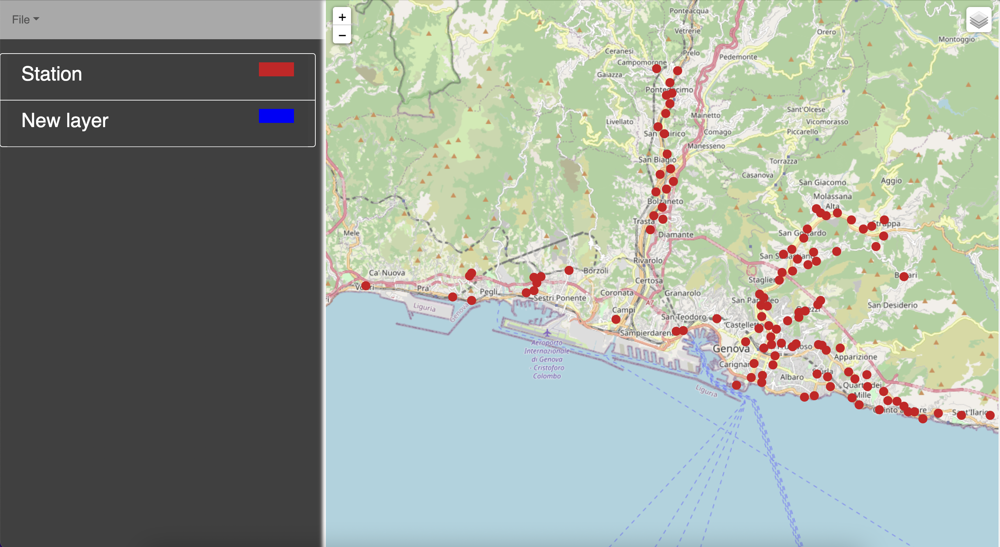

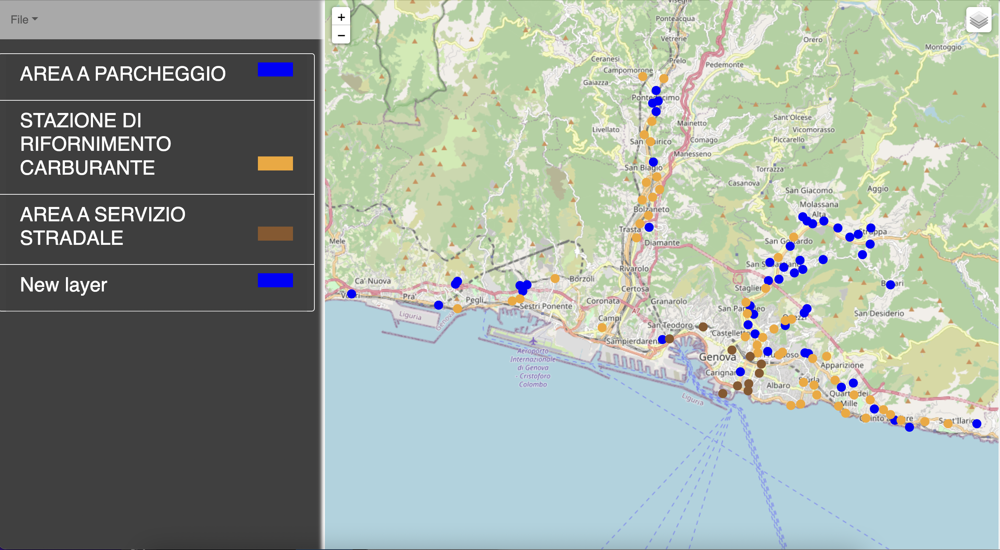